In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3504.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3926.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3721.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3851.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3749.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3975.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3223.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3577.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3615.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3931.txt


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.5/974.5 kB 35.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 37.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.9.90
    Uninstalling nvidia-curand-cu12-1

In [3]:
from ultralytics import YOLO

# Build a YOLOv6s model from scratch
model = YOLO("yolov6s.yaml")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
cp -r /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5 /kaggle/working/

In [5]:
coco128 = """# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /kaggle/working/JU_yolov5  # dataset root dir
train: /kaggle/working/JU_yolov5/train  # train images 128 images
val: /kaggle/working/JU_yolov5/valid  # val images 128 images
test: /kaggle/working/JU_yolov5/valid # test images (optional)

# Classes
nc: 14  # number of classes
names: ['trak', 'cyclist', 'bike', 'tempo', 'car', 'zeep', 'toto', 'e-rickshaw', 'auto-rickshaw', 'bus', 'van', 'cycle-rickshaw', 'person', 'taxi'] # class names
"""

with open('/kaggle/working/JU_yolov5/data.yaml', 'w') as f:
  f.write(coco128)

In [6]:
model.train(data="/kaggle/working/JU_yolov5/data.yaml", batch=16, cos_lr=True, verbose=True, epochs=75, imgsz=640)

Ultralytics 8.3.107 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov6s.yaml, data=/kaggle/working/JU_yolov5/data.yaml, epochs=75, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_b

100%|██████████| 755k/755k [00:00<00:00, 44.4MB/s]
E0000 00:00:1744360140.284026      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744360140.348363      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Overriding model.yaml nc=80 with nc=14
activation: torch.nn.ReLU()

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  2     73984  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 1]                
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  4    590848  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 1]              
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  6   3542016  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 1]              
  7                 

100%|██████████| 5.35M/5.35M [00:00<00:00, 164MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/JU_yolov5/train/labels... 3200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3200/3200 [00:02<00:00, 1510.17it/s]


train: New cache created: /kaggle/working/JU_yolov5/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/JU_yolov5/valid/labels... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:00<00:00, 1431.39it/s]

val: New cache created: /kaggle/working/JU_yolov5/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000556, momentum=0.9) with parameter groups 53 weight(decay=0.0), 62 weight(decay=0.0005), 61 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 75 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/75         3G      3.285      4.627      3.704         73        640: 100%|██████████| 200/200 [00:59<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:07<00:00,  3.51it/s]


                   all        800       2877      0.451      0.057      0.039     0.0128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/75      3.57G      2.137      2.901      2.302        139        640: 100%|██████████| 200/200 [00:57<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.91it/s]

                   all        800       2877      0.278      0.242       0.15     0.0708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/75      3.58G       1.83       2.37      1.853        136        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.96it/s]

                   all        800       2877      0.247      0.217      0.198      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/75      3.58G      1.634        2.1      1.659         88        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.78it/s]


                   all        800       2877      0.236      0.358      0.253      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/75      3.58G      1.499      1.855      1.522        127        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.64it/s]

                   all        800       2877      0.386      0.368      0.324      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/75      3.58G      1.415      1.715      1.451        124        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.71it/s]

                   all        800       2877       0.46      0.451      0.421      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/75      3.58G      1.368      1.584      1.402        132        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.60it/s]

                   all        800       2877      0.458      0.546      0.473      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/75      3.58G      1.304      1.489      1.357        116        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.71it/s]

                   all        800       2877      0.509      0.529      0.507      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/75      3.58G      1.253      1.426      1.322        132        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.81it/s]

                   all        800       2877      0.474      0.528      0.498      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/75      3.58G      1.219      1.337      1.282        138        640: 100%|██████████| 200/200 [00:56<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.75it/s]

                   all        800       2877      0.519       0.58      0.514      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/75      3.58G       1.17      1.284      1.266        101        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.78it/s]

                   all        800       2877      0.594      0.608      0.597      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/75      3.58G       1.14      1.224      1.243        103        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.00it/s]

                   all        800       2877      0.612      0.599      0.599      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/75      3.58G      1.122      1.165      1.219         99        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.00it/s]

                   all        800       2877      0.632      0.632      0.658      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/75      3.58G      1.102      1.138      1.206        113        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.02it/s]

                   all        800       2877      0.635      0.569      0.622       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/75      3.58G      1.095      1.118      1.205        128        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.10it/s]

                   all        800       2877      0.689      0.636      0.668      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/75      3.58G      1.056      1.071      1.178        101        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.04it/s]

                   all        800       2877      0.634      0.658      0.679      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/75      3.58G      1.036      1.044      1.163        122        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.00it/s]

                   all        800       2877      0.708      0.668       0.72      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/75      3.58G      1.027      1.013      1.153         74        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.99it/s]

                   all        800       2877      0.614      0.627      0.666      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/75      3.58G      1.012     0.9894      1.153        132        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.01it/s]

                   all        800       2877      0.705      0.681      0.736      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/75      3.58G     0.9802     0.9648      1.137        104        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.06it/s]

                   all        800       2877      0.698      0.696      0.737      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/75      3.58G     0.9743     0.9307      1.124        112        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.14it/s]

                   all        800       2877      0.742      0.707      0.768        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/75      3.58G      0.962     0.9223       1.12         69        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.13it/s]

                   all        800       2877      0.709      0.684      0.746      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/75      3.58G      0.954     0.9113      1.111        123        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.99it/s]

                   all        800       2877      0.713      0.718      0.763      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/75      3.58G      0.942     0.8733      1.101        103        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.08it/s]

                   all        800       2877      0.765       0.73      0.777      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/75      3.58G      0.933      0.863      1.099        124        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.08it/s]

                   all        800       2877      0.808      0.708      0.807      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/75      3.58G     0.9101     0.8536      1.094        159        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.11it/s]

                   all        800       2877        0.8      0.749      0.814      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/75      3.58G     0.9096      0.825      1.088        105        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.16it/s]

                   all        800       2877      0.739       0.76      0.806      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/75      3.58G     0.8873     0.8115      1.082         97        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.08it/s]

                   all        800       2877      0.829      0.737      0.822      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/75      3.58G     0.8898     0.7978      1.077         70        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.10it/s]

                   all        800       2877      0.865      0.729      0.832      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/75      3.58G     0.8731      0.788      1.063        101        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.08it/s]

                   all        800       2877      0.852      0.709      0.822      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/75      3.58G     0.8612     0.7733      1.062        116        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.10it/s]

                   all        800       2877      0.797      0.761      0.831      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/75      3.58G     0.8661     0.7571      1.063        104        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.80it/s]

                   all        800       2877      0.818      0.766      0.839      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/75      3.58G     0.8533      0.745      1.054         98        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.71it/s]

                   all        800       2877      0.818      0.773      0.841      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/75      3.58G     0.8495     0.7279      1.048         87        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.79it/s]

                   all        800       2877       0.85      0.757      0.849      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/75      3.58G     0.8318     0.7151       1.04         96        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.79it/s]

                   all        800       2877      0.868      0.752      0.851      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/75      3.58G     0.8229     0.7127       1.04        107        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.85it/s]

                   all        800       2877      0.823      0.755      0.836       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/75      3.58G     0.8121     0.7035      1.035        111        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.61it/s]

                   all        800       2877      0.841      0.784      0.853       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/75      3.58G     0.8133     0.6945      1.033        115        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.66it/s]

                   all        800       2877      0.848      0.796      0.856        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/75      3.58G     0.8048     0.6785      1.025         97        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.78it/s]

                   all        800       2877      0.864      0.793      0.868      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/75      3.58G      0.805     0.6758       1.03        114        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.83it/s]

                   all        800       2877      0.868      0.772      0.861      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/75      3.58G     0.7875     0.6593      1.022        135        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.02it/s]

                   all        800       2877      0.899      0.763      0.868      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/75      3.58G     0.7997     0.6635      1.021        108        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.96it/s]

                   all        800       2877       0.87      0.789      0.865      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/75      3.58G      0.782     0.6502      1.012        122        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.97it/s]

                   all        800       2877      0.868      0.777      0.872       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/75      3.58G     0.7773     0.6358      1.012         82        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.92it/s]

                   all        800       2877      0.857      0.817      0.881      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/75      3.58G     0.7628     0.6289      1.005        149        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.93it/s]

                   all        800       2877      0.899      0.799      0.881      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/75      3.58G     0.7652     0.6218      1.005         92        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.91it/s]

                   all        800       2877      0.885      0.813       0.89      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/75      3.58G     0.7581     0.6255      1.007        106        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.94it/s]

                   all        800       2877       0.88      0.809      0.885       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/75      3.58G     0.7562     0.6207      1.003        108        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.98it/s]

                   all        800       2877      0.892      0.815       0.89      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/75      3.58G     0.7533     0.6102     0.9993        110        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.00it/s]

                   all        800       2877      0.889      0.817      0.888      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/75      3.58G     0.7412     0.6007     0.9975        144        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.11it/s]

                   all        800       2877      0.899      0.813      0.884      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/75      3.58G     0.7373     0.5947     0.9933         98        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.92it/s]

                   all        800       2877      0.895      0.813      0.892      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/75      3.58G     0.7251     0.5889     0.9936        150        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.14it/s]

                   all        800       2877      0.908       0.82      0.896      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/75      3.58G     0.7271     0.5788     0.9901        121        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.05it/s]

                   all        800       2877      0.906      0.823      0.894      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/75      3.58G     0.7207     0.5749     0.9884         71        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.15it/s]

                   all        800       2877       0.88      0.825      0.889      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/75      3.58G     0.7098     0.5619      0.983         96        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.09it/s]

                   all        800       2877      0.909      0.826      0.897      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/75      3.58G     0.7185     0.5681      0.987        120        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.04it/s]

                   all        800       2877      0.907      0.821      0.893      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/75      3.58G     0.7061     0.5577     0.9788         69        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.15it/s]

                   all        800       2877      0.919      0.813      0.897      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/75      3.58G      0.696       0.55     0.9719        127        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.11it/s]

                   all        800       2877      0.902      0.841      0.901      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/75      3.58G     0.6993     0.5514     0.9738        146        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.13it/s]

                   all        800       2877      0.915      0.831      0.902      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/75      3.58G     0.6964     0.5507      0.973         97        640: 100%|██████████| 200/200 [00:57<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.01it/s]

                   all        800       2877      0.917      0.831      0.902      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/75      3.58G     0.6969     0.5422     0.9738         97        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.12it/s]

                   all        800       2877      0.925       0.83      0.902       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/75      3.58G     0.6883       0.54     0.9696        108        640: 100%|██████████| 200/200 [00:57<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.08it/s]

                   all        800       2877       0.91      0.838      0.902       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/75      3.58G     0.6859     0.5392     0.9705         94        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.13it/s]

                   all        800       2877       0.92      0.832      0.903       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/75      3.58G     0.6839     0.5365       0.97        106        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.08it/s]

                   all        800       2877      0.927       0.83      0.903      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/75      3.58G     0.6763     0.5232     0.9622        148        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.77it/s]

                   all        800       2877      0.917      0.837      0.905      0.763


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/75      3.58G     0.6567     0.4879      0.943         60        640: 100%|██████████| 200/200 [00:57<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.95it/s]

                   all        800       2877      0.918      0.832      0.902      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/75      3.58G     0.6464     0.4701     0.9369         55        640: 100%|██████████| 200/200 [00:56<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.76it/s]

                   all        800       2877      0.929       0.83      0.904      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/75      3.58G     0.6376     0.4676     0.9364         66        640: 100%|██████████| 200/200 [00:56<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.83it/s]

                   all        800       2877      0.931      0.833      0.904      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/75      3.58G     0.6334     0.4617     0.9316         58        640: 100%|██████████| 200/200 [00:56<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.85it/s]

                   all        800       2877      0.934      0.833      0.905      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/75      3.58G     0.6364     0.4614     0.9341         40        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.89it/s]

                   all        800       2877      0.935      0.834      0.905      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/75      3.58G       0.63     0.4574     0.9327         69        640: 100%|██████████| 200/200 [00:56<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.99it/s]

                   all        800       2877      0.929      0.838      0.905      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/75      3.58G     0.6244     0.4545     0.9317         59        640: 100%|██████████| 200/200 [00:56<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.06it/s]

                   all        800       2877       0.92      0.845      0.903      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/75      3.58G     0.6262     0.4622     0.9289         42        640: 100%|██████████| 200/200 [00:56<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  4.08it/s]

                   all        800       2877      0.937      0.835      0.905      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/75      3.58G     0.6303     0.4585     0.9316         45        640: 100%|██████████| 200/200 [00:56<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:06<00:00,  3.85it/s]

                   all        800       2877      0.933      0.836      0.907      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/75      3.58G     0.6237     0.4534     0.9259         36        640: 100%|██████████| 200/200 [00:56<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:07<00:00,  3.54it/s]

                   all        800       2877      0.932      0.839      0.906      0.764



75 epochs completed in 1.336 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 32.8MB
Optimizer stripped from runs/detect/train/weights/best.pt, 32.8MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv6s summary (fused): 68 layers, 16,300,154 parameters, 0 gradients, 44.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 25/25 [00:07<00:00,  3.23it/s]


                   all        800       2877      0.933      0.837      0.907      0.765
                  trak        113        120      0.933      0.925      0.961      0.896
               cyclist        188        234      0.894      0.735      0.834      0.652
                  bike        340        486      0.964      0.807      0.914      0.726
                 tempo        123        134       0.94      0.806      0.905      0.783
                   car        307        524      0.955      0.804      0.913      0.755
                  zeep         78         79      0.897      0.771      0.883      0.788
                  toto         63         66      0.956       0.97      0.975       0.87
            e-rickshaw         53         54      0.935          1      0.961      0.841
         auto-rickshaw        145        192      0.952      0.724      0.871      0.662
                   bus         83         91      0.903       0.92       0.95      0.825
                   va

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f7fe61a8390>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.0


image 1/1 /kaggle/working/JU_yolov5/valid/images/3861.jpg: 384x640 1 zeep, 34.0ms
Speed: 2.3ms preprocess, 34.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/JU_yolov5/valid/images/3626.jpg: 384x640 2 bikes, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/JU_yolov5/valid/images/3214.jpg: 384x640 2 persons, 1 taxi, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/JU_yolov5/valid/images/3295.jpg: 384x640 1 bike, 4 cars, 1 auto-rickshaw, 1 bus, 1 person, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/JU_yolov5/valid/images/3343.jpg: 384x640 1 cyclist, 1 car, 1 person, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/working/JU_yolo

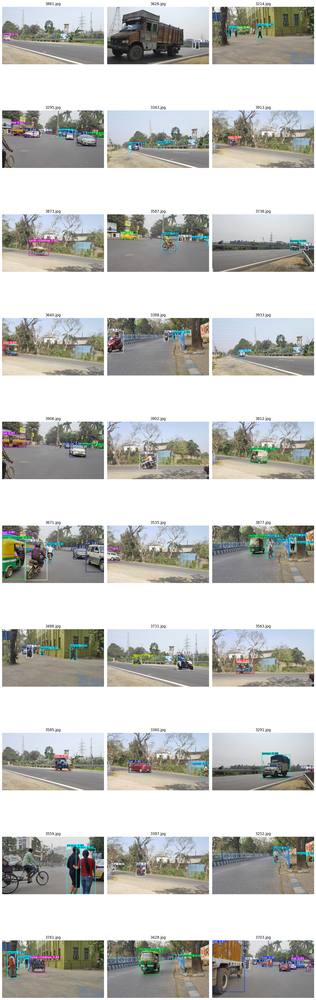

In [7]:
import os
import random
import cv2
import numpy as np
from IPython.display import display, Image
from tqdm import tqdm 
import random
import matplotlib.pyplot as plt
import yaml
import shutil

def run_yolov6(image_dir, model_path, total_image=30, output_folder="/kaggle/working/result_vis"):
    # Load the YOLOv6 model
    model = YOLO(model_path)
    
    # Ensure the output folder exists
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Loop through all images in the directory
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    
    # Select the specified number of random images or all images if total_image is -1
    if total_image == -1:
        selected_files = image_files
    else:
        selected_files = random.sample(image_files, min(total_image, len(image_files)))

    result_images = []  # List to hold result images

    for image_file in selected_files:
        # Load the image
        image_path = os.path.join(image_dir, image_file)
        image = cv2.imread(image_path)

        # Run YOLOv11 segmentation prediction
        results = model.predict(image_path, conf=0.7, iou=0.7)
        
        # Get the segmented mask and draw it on the image
        result_image = results[0].plot()
        
        # Save the result image in the output folder
        output_image_path = os.path.join(output_folder, image_file)
        cv2.imwrite(output_image_path, result_image)
        
        # Append the result image to the list
        result_images.append(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB

    # Display all result images in a grid
    num_images = len(result_images)
    cols = 3  # Number of columns for the grid
    rows = (num_images + cols - 1) // cols  # Calculate the number of rows needed

    plt.figure(figsize=(15, 5 * rows))  # Adjust the figure size as needed
    for i in range(num_images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(result_images[i])
        plt.axis('off')
        plt.title(selected_files[i])  # Optionally add titles

    plt.tight_layout()
    plt.show()



run_yolov6("/kaggle/working/JU_yolov5/valid/images", model_path = "/kaggle/working/runs/detect/train/weights/best.pt")